<ipython-input-1-570c8b726182>:4: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.imshow(IC) # visualize image using imshow function
<ipython-input-1-570c8b726182>:5: FutureWarning: `show` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  sk.io.show()


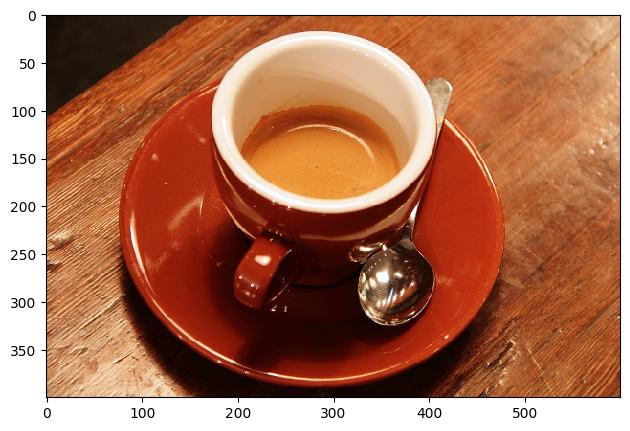

M = 400 columns, N = 600 rows, NC = 3 color channels


In [ ]:
import skimage as sk # load skimage libraries
IC = sk.data.coffee() # load a color image from the skimage built-in dataset
# change colormap to visualize image
sk.io.imshow(IC) # visualize image using imshow function
sk.io.show()
print('M = {} columns, N = {} rows, NC = {} color channels'.format(*IC.shape)) # Print out image size


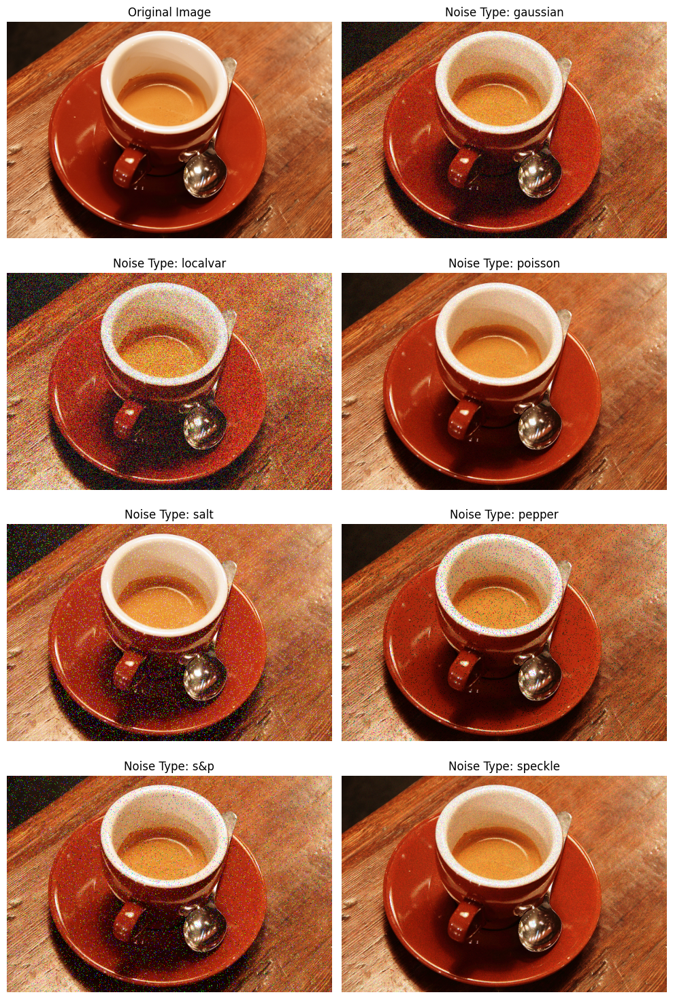

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from skimage import data, img_as_uint
from skimage.util import random_noise
from skimage.filters import gaussian, prewitt
from skimage.data import binary_blobs
from skimage.morphology import erosion, disk
from skimage.color import rgb2gray
from scipy import ndimage
import math

coffee = data.coffee()
noise_types = ['gaussian', 'localvar', 'poisson', 'salt', 'pepper', 's&p', 'speckle']
fig, axes = plt.subplots(4, 2, figsize=(10, 15))

axes[0, 0].imshow(coffee, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')


for i, noise_type in enumerate(noise_types):

    row = (i + 1) // 2
    col = (i + 1) % 2

    if noise_type == 'localvar':
        local_variance = np.random.rand(*coffee.shape) * 0.1
        noisy_image = random_noise(coffee, mode='gaussian', var=local_variance)
    else:
        noisy_image = random_noise(coffee, mode=noise_type)

    axes[row, col].imshow(noisy_image, cmap='gray')
    axes[row, col].set_title(f'Noise Type: {noise_type}')
    axes[row, col].axis('off')

plt.tight_layout()

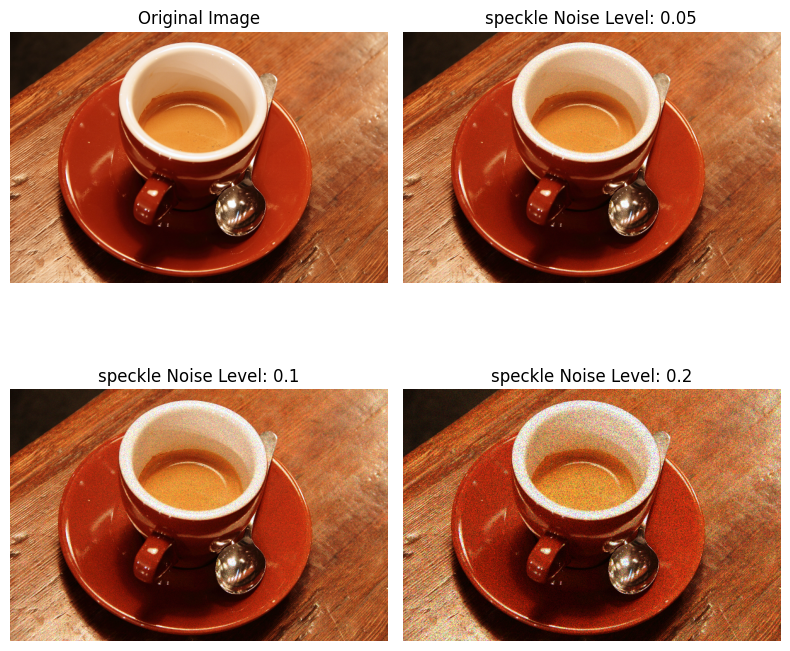

In [ ]:
noise_type = 'speckle'  # Change noise type to speckle
noise_levels = [0.05, 0.1, 0.2]  # Noise variances

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes[0, 0].imshow(coffee, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

for i, noise_level in enumerate(noise_levels):
    # For speckle noise, use var to control noise intensity
    noisy_image = random_noise(coffee, mode=noise_type, var=noise_level**2)

    row = (i + 1) // 2
    col = (i + 1) % 2

    axes[row, col].imshow(noisy_image, cmap='gray')
    axes[row, col].set_title(f'speckle Noise Level: {noise_level}')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


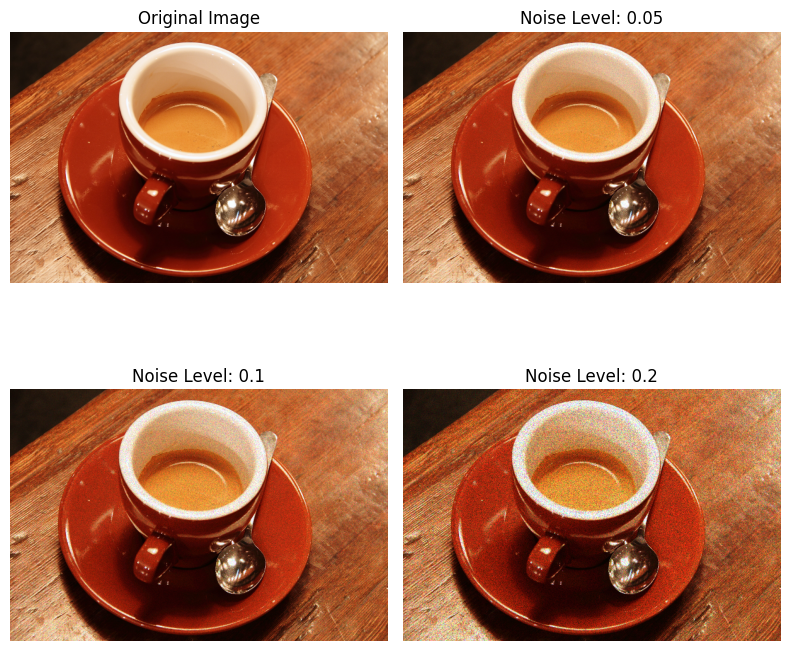

In [ ]:
noise_type = 'speckle'  # Change noise type to speckle
noise_levels = [0.05, 0.1, 0.2]  # Noise variances

fig, axes = plt.subplots(2, 2, figsize=(8, 8))
axes[0, 0].imshow(coffee, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

for i, noise_level in enumerate(noise_levels):
    # For speckle noise, use var to control noise intensity
    noisy_image = random_noise(coffee, mode=noise_type, var=noise_level**2)

    row = (i + 1) // 2
    col = (i + 1) % 2

    axes[row, col].imshow(noisy_image, cmap='gray')
    axes[row, col].set_title(f'Noise Level: {noise_level}')
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


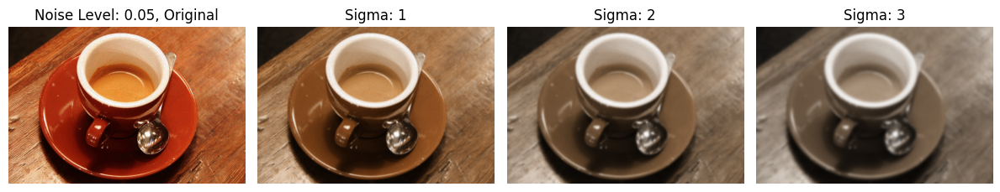

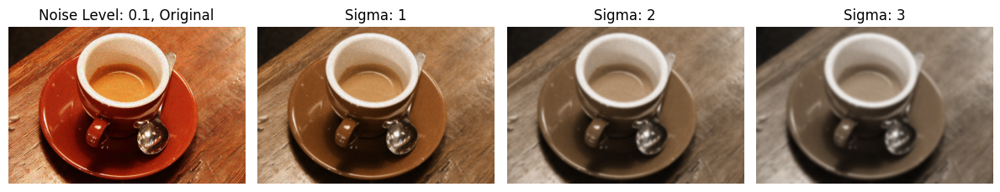

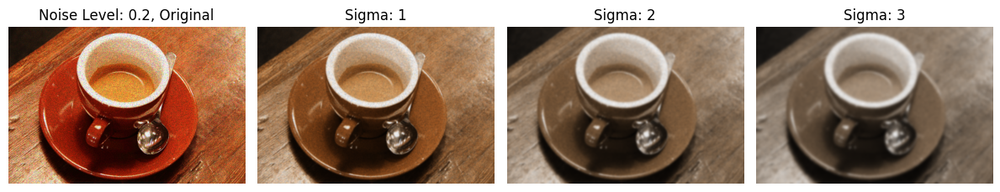

In [ ]:
sigma_values = [1, 2, 3]  # Adjust sigma values as needed

for i, noise_level in enumerate(noise_levels):
    noisy_image = random_noise(coffee, mode=noise_type, var=noise_level**2)  # Use var for Gaussian
    fig, axes = plt.subplots(1, len(sigma_values) + 1, figsize=(12, 4))
    axes[0].imshow(noisy_image, cmap='gray')
    axes[0].set_title(f'Noise Level: {noise_level}, Original')
    axes[0].axis('off')

    for j, sigma in enumerate(sigma_values):
        filtered_image = gaussian(noisy_image, sigma=sigma)
        axes[j + 1].imshow(filtered_image, cmap='gray')
        axes[j + 1].set_title(f'Sigma: {sigma}')
        axes[j + 1].axis('off')

    plt.tight_layout()

    #as sigma increases the image becomes more blurry smoothing the gaussian noise but also losing finer details

Brick Fraction: 0.8077
Edge Fraction: 0.9857


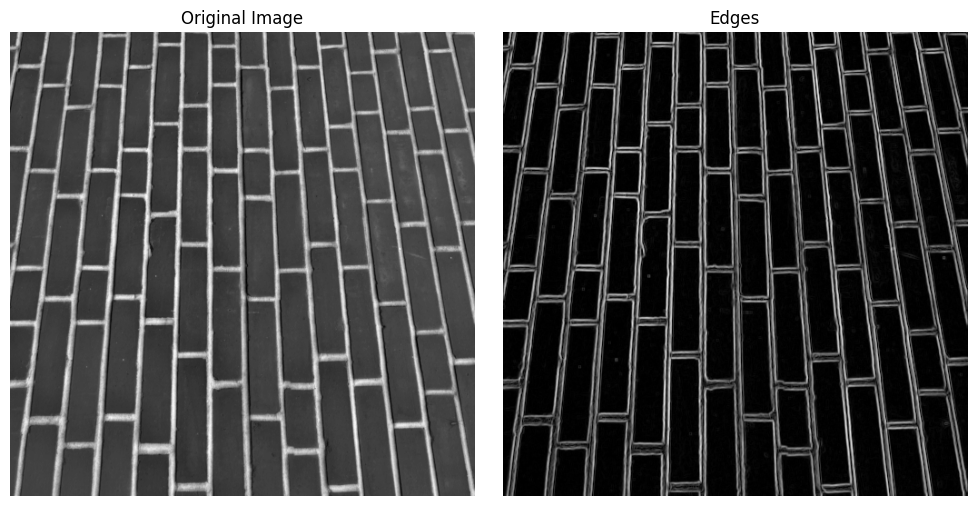

In [ ]:
bricks = data.brick()
edges = prewitt(bricks)

# Calculate fractions
total_pixels = bricks.size
brick_pixels = np.count_nonzero(bricks < 128)  # bricks are darker
edge_pixels = np.count_nonzero(edges)

brick_fraction = brick_pixels / total_pixels
edge_fraction = edge_pixels / total_pixels

print(f"Brick Fraction: {brick_fraction:.4f}")
print(f"Edge Fraction: {edge_fraction:.4f}")

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(bricks, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(edges, cmap='gray')
axes[1].set_title('Edges')
axes[1].axis('off')
plt.tight_layout()

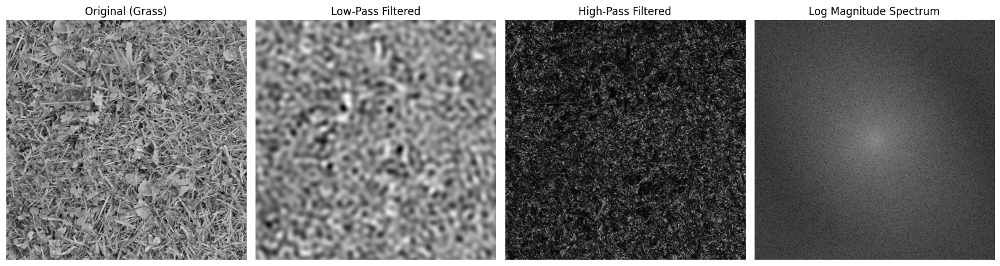

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, img_as_float
from skimage.color import rgb2gray
from skimage.util import random_noise

# Load the built-in grass image and convert to grayscale float
grass = img_as_float(data.grass())

# 1. Compute the DFT of the image and shift the zero-frequency component to the center
f = np.fft.fft2(grass)
fshift = np.fft.fftshift(f)

# Save shape info
rows, cols = grass.shape
crow, ccol = rows // 2 , cols // 2

# LOW-PASS FILTER
low_pass = fshift.copy()

# Create circular mask
radius = 30
row, col = np.ogrid[:rows, :cols]
mask_area = (row - crow)**2 + (col - ccol)**2 > radius**2
low_pass[mask_area] = 0  # keep only low frequencies

# Inverse DFT to get filtered image
low_pass_ishift = np.fft.ifftshift(low_pass)
low_pass_img = np.fft.ifft2(low_pass_ishift)
low_pass_img = np.abs(low_pass_img)

# HIGH-PASS FILTER

high_pass = fshift.copy()

# Zero out low-frequency region in the center
high_pass[~mask_area] = 0  # remove low frequencies

# Inverse DFT
high_pass_ishift = np.fft.ifftshift(high_pass)
high_pass_img = np.fft.ifft2(high_pass_ishift)
high_pass_img = np.abs(high_pass_img)

# ------------------------------
# Visualization
# ------------------------------
fig, axes = plt.subplots(1, 4, figsize=(16, 6))
axes[0].imshow(grass, cmap='gray')
axes[0].set_title('Original (Grass)')
axes[1].imshow(low_pass_img, cmap='gray')
axes[1].set_title('Low-Pass Filtered')
axes[2].imshow(high_pass_img, cmap='gray')
axes[2].set_title('High-Pass Filtered')
axes[3].imshow(np.log(1 + np.abs(fshift)), cmap='gray')
axes[3].set_title('Log Magnitude Spectrum')

for ax in axes:
    ax.axis('off')

plt.tight_layout()
plt.show()



In [ ]:
blobs = binary_blobs(length=32, blob_size_fraction=0.1, volume_fraction=0.5)
footprint = disk(3)
num_erosions = 0

while np.any(blobs):  # Check if any blobs remain
    blobs = erosion(blobs, footprint)
    num_erosions += 1

print(f"Number of erosions needed: {num_erosions}")

Number of erosions needed: 2
